In [14]:
import os
import shutil
import pandas as pd
import numpy as np
from tqdm.contrib import tzip
import tqdm
from pandas import DataFrame

In [13]:
study_number = '01'
res = 256
resolution = str(res)+'x'+str(res)
prefix_path = '/content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/'
study_prefix_path = prefix_path + 'gan_experiment_'+ study_number + '/'


dataset_prefix = study_prefix_path + 'ds_256/'

train_path = prefix_path+'train/'
test_path = prefix_path+'test/'
validation_path = prefix_path+'validation/'
ds_complete_path = prefix_path+'ds_complete/'

In [7]:
# !mkdir /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/
# !mkdir /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/generated/

In [10]:
!mv /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/train/* /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/ds_complete/
!mv /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/test/* /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/ds_complete/
!mv /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/validation/* /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/ds_complete/


In [11]:
!ls /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/train/ | wc -l
!ls /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/test/ | wc -l
!ls /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/validation/ | wc -l
!ls /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/ds_complete/ | wc -l

!ls /content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/generated/ | wc -l

0
0
0
4080
0


In [15]:
print('train_path: ', len(os.listdir(train_path)))
print('test_path: ', len(os.listdir(test_path)))
print('validation_path: ', len(os.listdir(validation_path)))
print('ds_complete_path: ', len(os.listdir(ds_complete_path)))

train_path:  0
test_path:  0
validation_path:  0
ds_complete_path:  4080


####Preparing Dataset - Moving files

In [16]:
df = DataFrame(os.listdir(ds_complete_path))

In [17]:
def train_validate_test_split(df, train_percent=.7, validate_percent=.2, seed=None):
    np.random.seed(seed)
    perm = np.random.permutation(df.index)
    m = len(df.index)
    train_end = int(train_percent * m)
    validate_end = int(validate_percent * m) + train_end
    train = df.iloc[perm[:train_end]]
    validate = df.iloc[perm[train_end:validate_end]]
    test = df.iloc[perm[validate_end:]]
    return train, validate, test

In [18]:
ds_train, ds_validate, ds_test = train_validate_test_split(df, train_percent=0.75,validate_percent=0.2, seed=43)

In [19]:
print("Train Size: "+str(len(ds_train)))
print("Test Size: " + str(len(ds_test)))
print("Validation Size: " + str(len(ds_validate)))

Train Size: 3060
Test Size: 204
Validation Size: 816


In [20]:
ds_train.to_csv(str(study_prefix_path+'ds_train_'+resolution+'_'+study_number+'.csv'))
ds_test.to_csv(str(study_prefix_path+'ds_test_'+resolution+'_'+study_number+'.csv'))
ds_validate.to_csv(str(study_prefix_path+'ds_validate_'+resolution+'_'+study_number+'.csv'))

In [21]:
print('train_path: '+str(len(os.listdir(train_path))))
print('test_path: '+str(len(os.listdir(test_path))))
print('validation_path: '+str(len(os.listdir(validation_path))))
print('ds_complete_path: '+str(len(os.listdir(ds_complete_path))))

train_path: 0
test_path: 0
validation_path: 0
ds_complete_path: 4080


In [22]:
for tr in tqdm.notebook.tqdm(ds_train[0]):
    if os.path.exists(ds_complete_path+tr):
        shutil.move(ds_complete_path+tr, train_path+tr)
    # break

  0%|          | 0/3060 [00:00<?, ?it/s]

In [23]:
for ts in tqdm.notebook.tqdm(ds_test[0]):
    if os.path.exists(ds_complete_path+ts):
        shutil.move(ds_complete_path+ts, test_path+ts)
    # break

  0%|          | 0/204 [00:00<?, ?it/s]

In [24]:
for vl in tqdm.notebook.tqdm(ds_validate[0]):
    if os.path.exists(ds_complete_path+vl):
        shutil.move(ds_complete_path+vl, validation_path+vl)
    # break

  0%|          | 0/816 [00:00<?, ?it/s]

####Defining constants

In [25]:
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256
steps_gan = 45000

In [ ]:
# !mkdir /content/drive/MyDrive/ColabNotebooks/Lakehead_study/bones_mask_ds/gan_experiment_02/256x256_02/

In [26]:
checkpoint_dir = study_prefix_path+resolution+'_'+study_number+'/'+'training_checkpoints'+'/'
log_dir= study_prefix_path+resolution+'_'+study_number +'/'+ "log_"+study_number+'/'
fit_dir= log_dir+'fit/'

In [66]:
checkpoint_dir

'/content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/256x256_01/training_checkpoints/'

In [71]:
os.listdir(log_dir)

['fit']

In [67]:
# os.mkdir(checkpoint_dir)
# os.mkdir(log_dir)
# os.mkdir(fit_dir)

FileExistsError: ignored

In [27]:
if(os.path.exists(checkpoint_dir) and os.path.exists(log_dir) and os.path.exists(fit_dir)):
    print(checkpoint_dir)
    print(log_dir)
    print(fit_dir)

In [28]:
import tensorflow as tf
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [29]:
sample_image = tf.io.read_file(train_path + os.listdir(train_path)[0])
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(1024, 2048, 3)


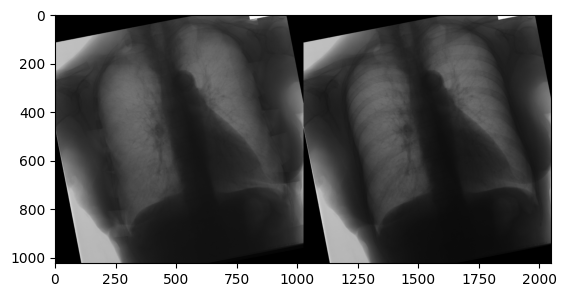

In [30]:
plt.figure()
plt.imshow(sample_image)

####Defining utils functions

In [31]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                  method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [32]:
def load(image_file):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # Split each image tensor into two tensors:
    # - one with a real building facade image
    # - one with an architecture label image
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, w:, :]
    real_image = image[:, :w, :]

    input_image, real_image = resize(input_image, real_image,
                                    IMG_HEIGHT, IMG_WIDTH)

    # Convert both images to float32 tensors
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)


    return input_image, real_image

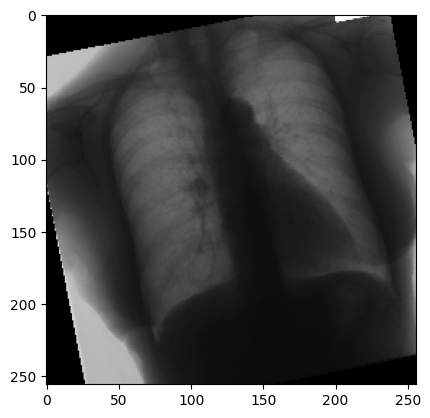

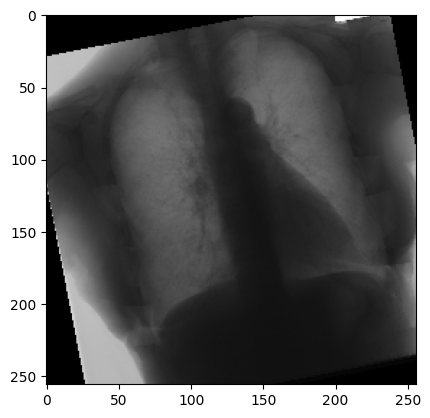

In [33]:
inp, re = load(str(train_path + os.listdir(train_path)[0]))
# Casting to int for matplotlib to display the images
plt.figure()
# plt.
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [34]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

In [35]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [36]:
@tf.function()
def random_jitter(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
      # Random mirroring
      input_image = tf.image.flip_left_right(input_image)
      real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

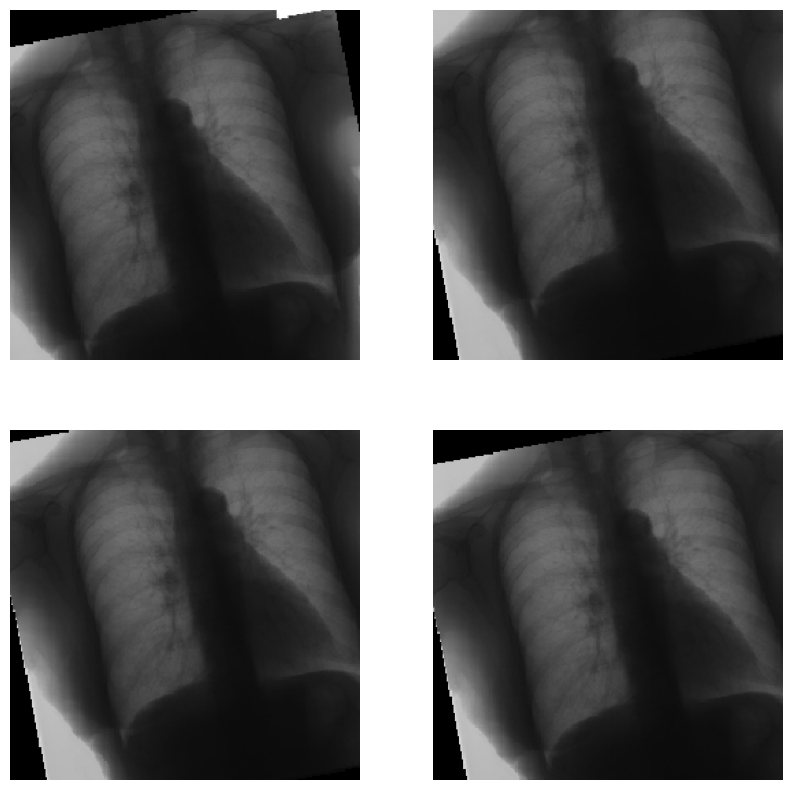

In [37]:
plt.figure(figsize=(10, 10))
for i in range(4):
    rj_inp, rj_re = random_jitter(inp, re)
    plt.subplot(2, 2, i + 1)
    plt.imshow(rj_inp / 255.0)
    plt.axis('off')
plt.show()

In [38]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    # input_image, real_image = resize(input_image, real_image,
    #                                 IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [39]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    # input_image, real_image = resize(input_image, real_image,
    #                                 IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

####Loading Dataset

In [40]:
train_dataset = tf.data.Dataset.list_files(train_path+'*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
# try:
#     test_dataset = tf.data.Dataset.list_files(test_path+'*.png')
# except tf.errors.InvalidArgumentError:
#     test_dataset = tf.data.Dataset.list_files(test_path+'*.png')
# test_dataset = test_dataset.map(load_image_test)
# test_dataset = test_dataset.batch(BATCH_SIZE)

In [41]:
try:
    test_dataset = tf.data.Dataset.list_files(validation_path+'*.png')
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(validation_path+'*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

####Generator

In [42]:
OUTPUT_CHANNELS = 3

In [43]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2,
                               padding='same',
                               kernel_initializer=initializer,
                               use_bias=False))

    if apply_batchnorm:
      result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [44]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [45]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [46]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [47]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
      downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
      downsample(128, 4),  # (batch_size, 64, 64, 128)
      downsample(256, 4),  # (batch_size, 32, 32, 256)
      downsample(512, 4),  # (batch_size, 16, 16, 512)
      downsample(512, 4),  # (batch_size, 8, 8, 512)
      downsample(512, 4),  # (batch_size, 4, 4, 512)
      downsample(512, 4),  # (batch_size, 2, 2, 512)
      downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
      upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
      upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
      upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
      upsample(512, 4),  # (batch_size, 16, 16, 1024)
      upsample(256, 4),  # (batch_size, 32, 32, 512)
      upsample(128, 4),  # (batch_size, 64, 64, 256)
      upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                          strides=2,
                                          padding='same',
                                          kernel_initializer=initializer,
                                          activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

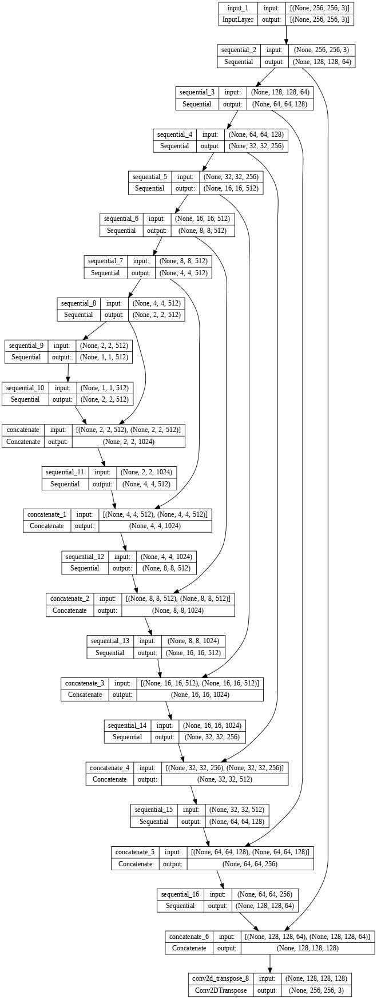

In [48]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

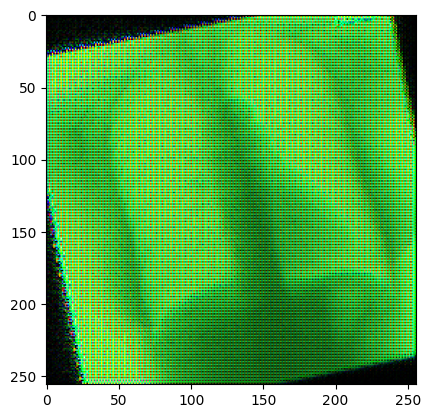

In [49]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

####Generator loss

In [50]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [51]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

####Discriminator

In [52]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

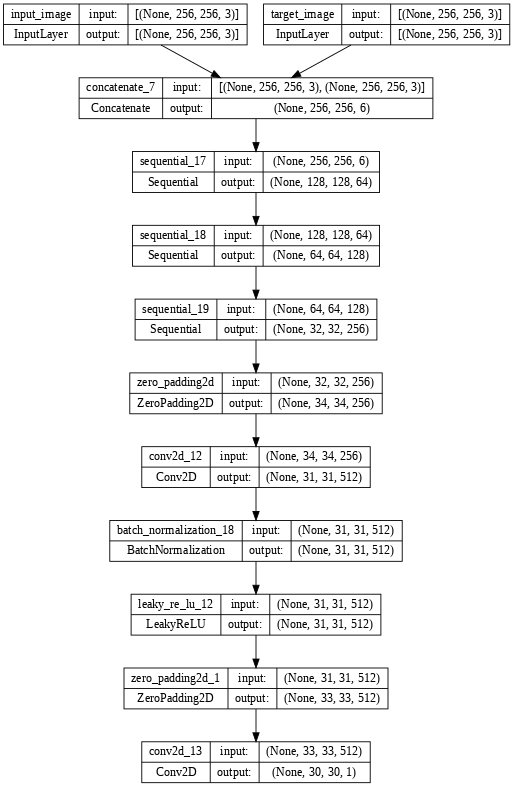

In [53]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

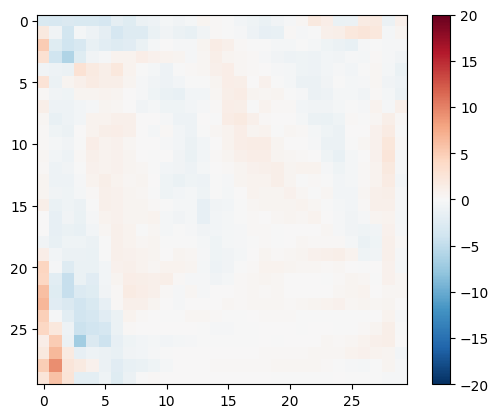

In [54]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

####Discriminator Loss

In [55]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [56]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [57]:
if os.path.isdir(checkpoint_dir):
    print('Setted directory as: ' + checkpoint_dir)
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                    discriminator_optimizer=discriminator_optimizer,
                                    generator=generator,
                                    discriminator=discriminator)
else:
    print('Directory doesnot exist')

Directory doesnot exist


###Generate image

In [58]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(20, 20))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

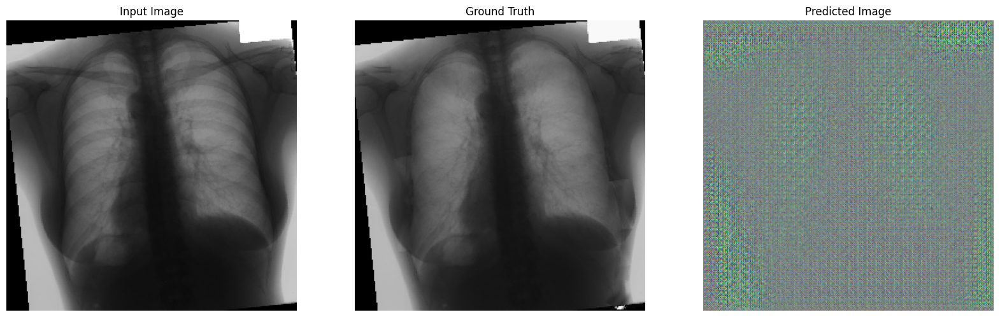

In [59]:
for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

In [60]:
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + str(resolution)+'_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [61]:
"fit/" + str(resolution)+'_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

'fit/256x256_20230623-232915'

In [65]:
log_dir

'/content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/256x256_01/log_01/'

In [74]:
checkpoint_dir = '/content/drive/MyDrive/ColabNotebooks/Lakehead_study/complete_image/gan_experiment_01/training_checkpoints/'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [62]:
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [63]:
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

    # Before out the fit() function, save the model
    generator.compile()
    generator.save(study_prefix_path+'model_'+str(study_number))

In [64]:
os.listdir(study_prefix_path)

['generated',
 'ds_train_256x256_01.csv',
 'ds_test_256x256_01.csv',
 'ds_validate_256x256_01.csv',
 '256x256_01']

In [72]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

Time taken for 1000 steps: 89.91 sec



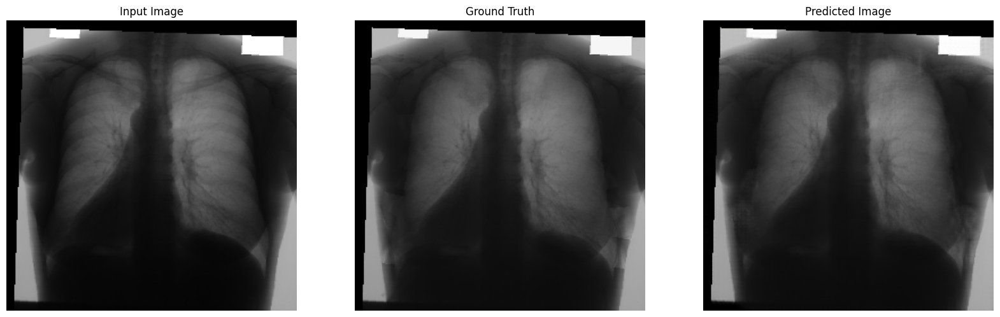

Step: 44k
....................................................................................................

In [75]:
fit(train_dataset, test_dataset, steps=steps_gan)

In [ ]:
!tensorboard dev upload --logdir {log_dir}


***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/ColabNotebooks/Lakehead_study/bones_mask_ds/gan_experiment_02/256x256_02/log_02/

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Faut

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

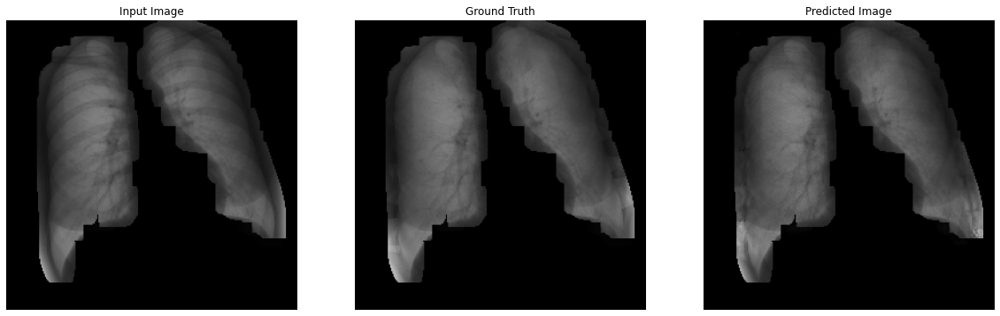

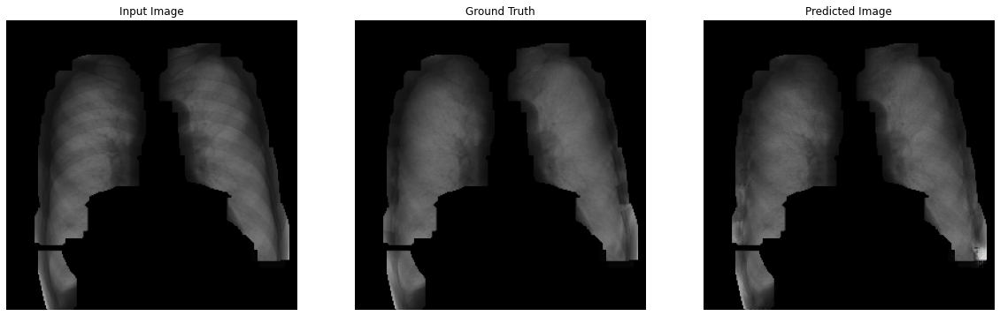

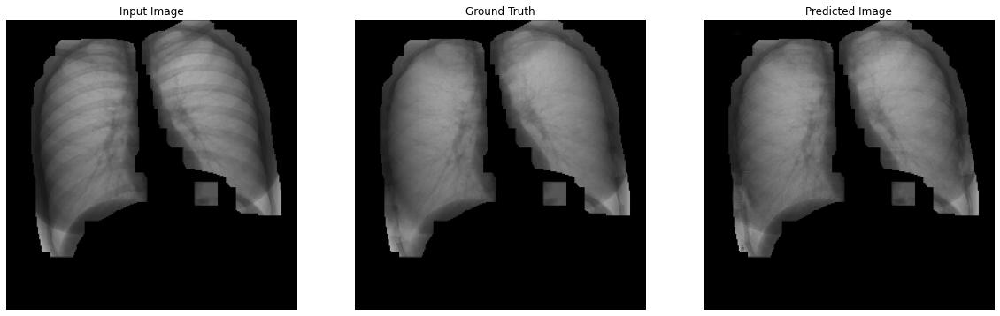

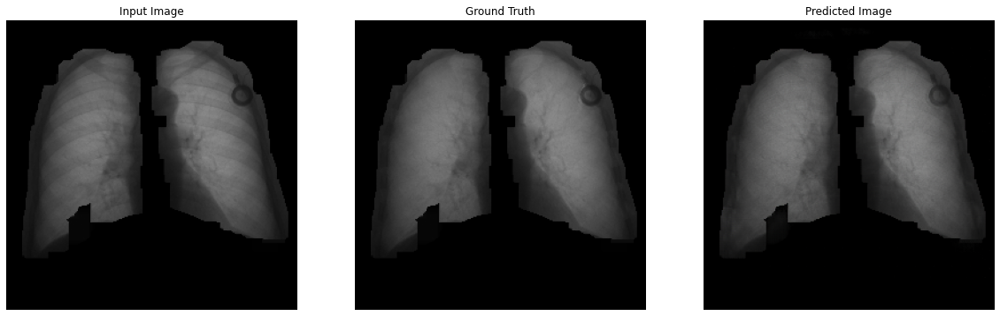

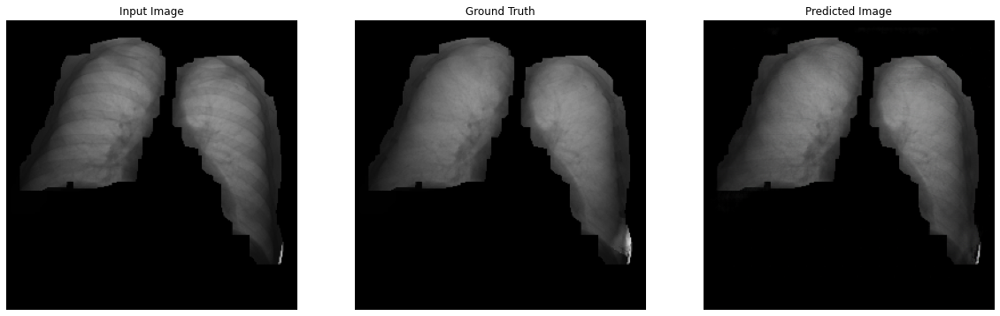

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)